In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [7]:
from sklearn.preprocessing import StandardScaler

In [2]:
dataframe = pd.read_csv("./creditcard.csv")

In [3]:
dataframe

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


In [6]:
dataframe.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,...,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [11]:
scaler = StandardScaler()
dataframe["Amount"] = (dataframe["Amount"]  - dataframe["Amount"].mean()) / dataframe["Amount"].std()

In [5]:
dataframe["Class"].value_counts() # the dataset is imbalanced 492 fraud for 284315 normal transactions

0    284315
1       492
Name: Class, dtype: int64

(-1.0, 1.0)

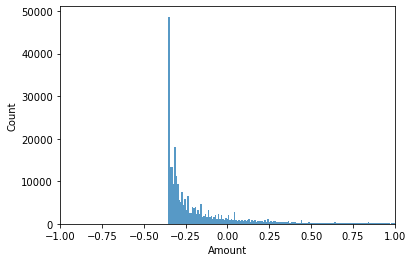

In [16]:
plt.clf()
sns.histplot(dataframe["Amount"]) #amount distribution, the distibution is skewed to the left 
plt.xlim((-1,1))

<AxesSubplot:>

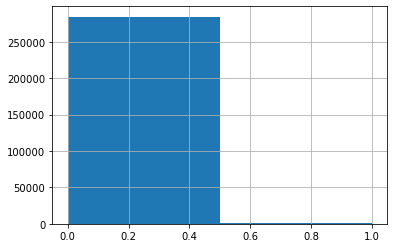

In [54]:
print(dataframe.Class.value_counts)
dataframe["Class"].hist(bins=2)

(-3.0, 3.0)

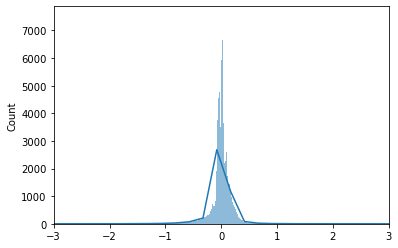

In [45]:
plt.clf()
sns.histplot(dataframe.V28.values, kde=True,)
plt.xlim((-3,3))

(-3.0, 3.0)

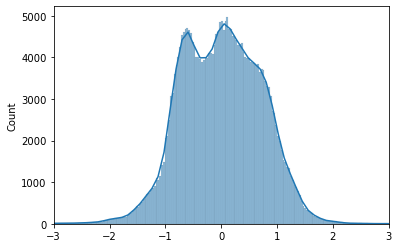

In [46]:
plt.clf()
sns.histplot(dataframe.V22.values, kde=True,)
plt.xlim((-3,3))

(-3.0, 3.0)

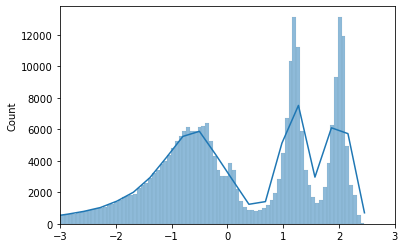

In [47]:
plt.clf()
sns.histplot(dataframe.V1.values, kde=True,)
plt.xlim((-3,3))

(-3.0, 3.0)

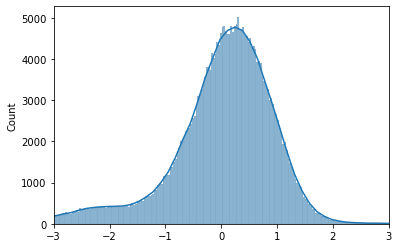

In [48]:
plt.clf()
sns.histplot(dataframe.V12.values, kde=True,)
plt.xlim((-3,3))

In [49]:
# Majority of columns have a normal gausien distribution or a composition of gausiens

#### Correlation between features


<AxesSubplot:>

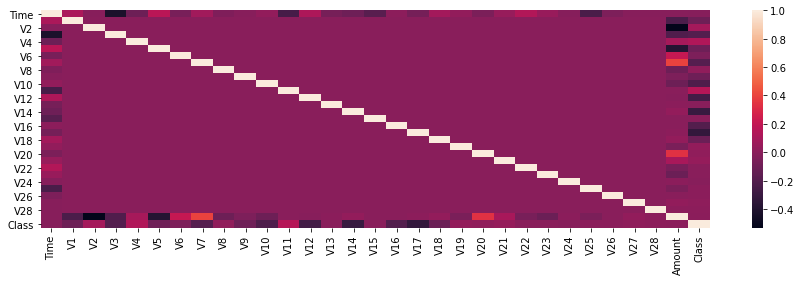

In [52]:
plt.figure(figsize=(15,4))
sns.heatmap(dataframe.corr())

This correlation doesn't provide much information, it's maybe due to our imbalanced dataset, we will try to sample the data and see if we can get more information from the correlation matrix

In [17]:
df = dataframe.sample(frac=1)
fraud = df.loc[df["Class"] == 1]
normal = df.loc[df["Class"] == 0][:fraud.shape[0]]

In [18]:
sample_df = pd.concat([fraud, normal])

<AxesSubplot:>

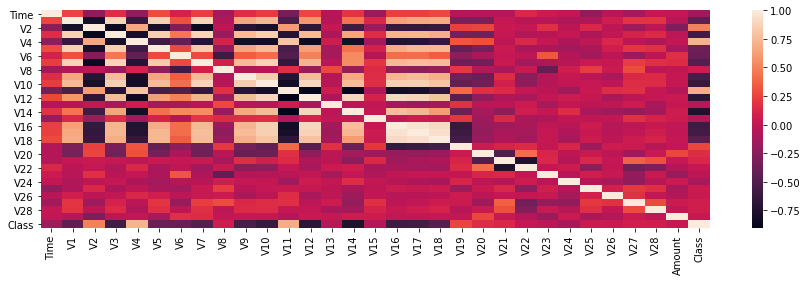

In [19]:
plt.figure(figsize=(15,4))
sns.heatmap(sample_df.corr())

In [20]:
def draw_corr_matrix(corr):
    corr = sample_df.corr()
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(11, 9))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(230, 20, as_cmap=True,n=10)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
    plt.show()
    return

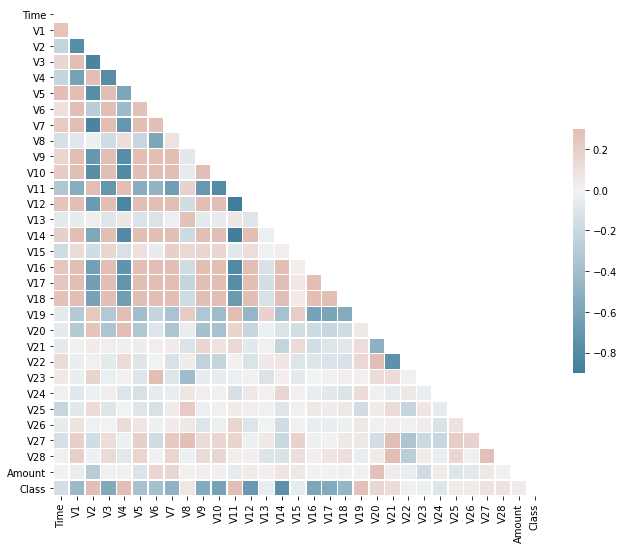

In [21]:
draw_corr_matrix(sample_df.corr)

In [91]:
class_corr = np.array(dataframe.corr().iloc[:,-1])
class_sampled_corr = np.array(sample_df.corr().iloc[:,-1])
class_sampled_corr - class_corr # correlation shift between the datasets

array([-1.87109016e-01, -3.27857413e-01,  3.99320210e-01, -3.66313098e-01,
        5.61698216e-01, -2.82377323e-01, -3.75838382e-01, -2.86349185e-01,
        3.12765927e-02, -4.59493766e-01, -4.11644833e-01,  5.34272913e-01,
       -4.21399394e-01, -4.61931125e-02, -4.46963233e-01, -4.71276524e-02,
       -3.94577189e-01, -2.26528317e-01, -3.47469411e-01,  2.20868160e-01,
        1.41106246e-01,  8.67520128e-02,  1.75607898e-04, -2.23813028e-02,
       -5.61721975e-02,  4.63983908e-02,  3.76137486e-02,  7.83224896e-02,
        4.65945227e-02,  6.91404385e-02,  0.00000000e+00])

#### Relationship between features


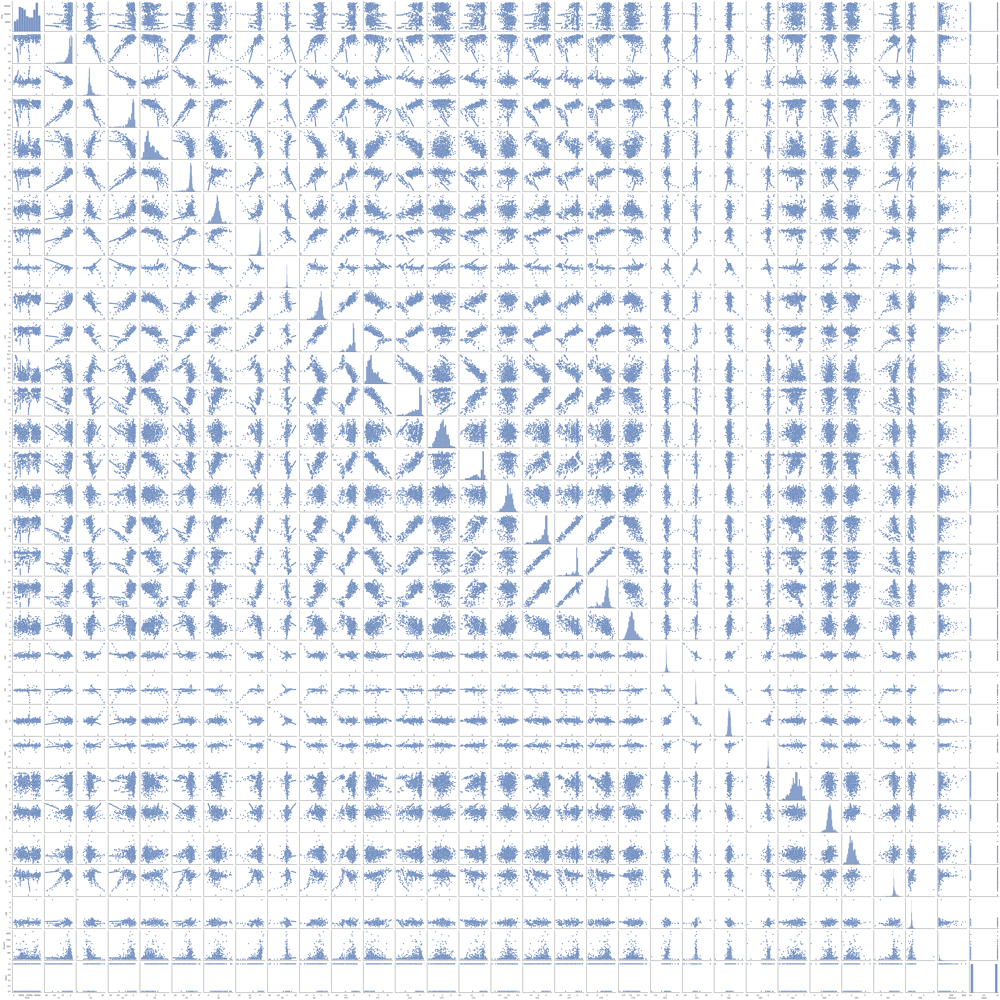

In [92]:
sns.pairplot(sample_df, kind="scatter")

From the previous plot we can see that there is no obvious relationship between the columns, maybe because these columns are the results of a PCA

### Classification Model

In [32]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, classification_report

In [24]:
X, y = sample_df.drop(["Class"], axis=1), sample_df["Class"]

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.25)

In [30]:
random_forest_classifier = RandomForestClassifier()
random_forest_classifier.fit(X_train, y_train)

RandomForestClassifier()

In [114]:
random_forest_classifier.score(X_test, y_test)

0.959349593495935

In [34]:
print(classification_report(y_test, random_forest_classifier.predict(X_test)))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96       123
           1       0.96      0.96      0.96       123

    accuracy                           0.96       246
   macro avg       0.96      0.96      0.96       246
weighted avg       0.96      0.96      0.96       246



### Let's compare these results to training the random forest on the imbalanced dataset

In [36]:
reel_X, reel_y = dataframe.drop(["Class"], axis=1), dataframe["Class"]

In [39]:
X_reel_train, X_reel_test, y_reel_train, y_reel_test = train_test_split(reel_X,reel_y, test_size=0.25)

In [40]:
random_forest_classifier_v1 = RandomForestClassifier()
random_forest_classifier_v1.fit(X_reel_train, y_reel_train)

RandomForestClassifier()

In [42]:
random_forest_classifier.score(X_reel_test, y_reel_test)

0.97243054970366

In [43]:
print(classification_report(y_reel_test, random_forest_classifier.predict(X_reel_test)))

              precision    recall  f1-score   support

           0       1.00      0.97      0.99     71078
           1       0.06      0.98      0.11       124

    accuracy                           0.97     71202
   macro avg       0.53      0.98      0.55     71202
weighted avg       1.00      0.97      0.98     71202



In [ ]:
prediction = random_forest_classifier.predict(X_test)
prediction_reel = random_forest_classifier_v1.predict(X_reel_test)

In [44]:
from sklearn.metrics import roc_curve

In [47]:
prediction = random_forest_classifier.predict(X_test)
fpr, tpr, threshold = roc_curve(prediction, y_test)

In [50]:
prediction_reel = random_forest_classifier_v1.predict(X_reel_test)
fpr_v1, tpr_v1, threshold_v1 = roc_curve(prediction_reel, y_reel_test)

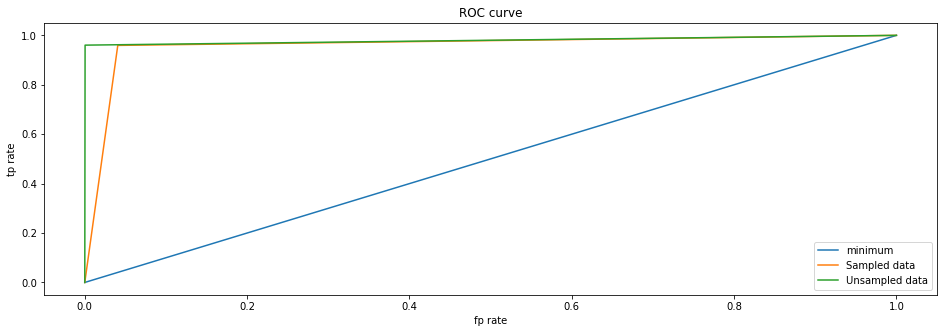

In [76]:
plt.figure(figsize=(16, 5))
plt.plot([0,1],[0,1], label="minimum")
plt.plot(fpr,tpr,label="Sampled data")
plt.plot(fpr_v1, tpr_v1,label="Unsampled data")
plt.xlabel("fp rate")
plt.ylabel("tp rate")
plt.title("ROC curve")
plt.legend()

#### if we had a balanced dataset from the beginning I think that the model trained on the whole dataset is performing 
#### better but we are focusing more on the f1 score


In [115]:
print(f"model trained on sampled data {f1_score(prediction, y_test)}")
print(f"model trained on unsampled data {f1_score(prediction_reel,y_reel_test)}")

model trained on sampled data 0.959349593495935
model trained on unsampled data 0.8622222222222222


we can see that the precision droped for fraud cases, the same goes to f1-score. 
Since we are more intrested in true positive prediction we can state that the first model is better

### Hyperparameter tunnig

Now that we that the best model is the one trainning on sampled data we are going to optimize this model if it's possible to do so

In [87]:
from sklearn.model_selection import GridSearchCV

In [102]:
param_grid = {
    "max_depth":[int(x) for x in np.linspace(10, 100, num=10)],
    "min_samples_split": [2, 5, 10, 20],
    "n_estimators": [int(x) for x in np.linspace(10, 200, num=20)]
}

In [103]:
random_f = RandomForestClassifier()

In [104]:
grid_search = GridSearchCV(estimator=random_f,
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=10,
                           verbose=1
                          )

In [105]:
grid_search.fit(X_train, y_train)

Fitting 10 folds for each of 800 candidates, totalling 8000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   16.2s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   31.3s
[Parallel(n_jobs=-1)]: Done 514 tasks      | elapsed:   55.9s
[Parallel(n_jobs=-1)]: Done 896 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 1558 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2304 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 3108 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 4160 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 5326 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 6468 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 7882 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 8000 out of 8000 | elapsed: 10.5min finished


GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
                         'min_samples_split': [2, 5, 10, 20],
                         'n_estimators': [10, 20, 30, 40, 50, 60, 70, 80, 90,
                                          100, 110, 120, 130, 140, 150, 160,
                                          170, 180, 190, 200]},
             verbose=1)

In [111]:
grid_search_model = grid_search.best_estimator_

In [112]:
grid_search_prediction = grid_search_model.predict(X_test)

In [116]:
f1_score(grid_search_prediction, y_test)

0.9512195121951219

### There is no improuvement with this new model, I think this is the limition of Random forest models